In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import pandas as pd
from apyori import apriori

from pandas_profiling import ProfileReport


from quickda.explore_data import *
from quickda.clean_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
from quickda.explore_time_series import *

In [2]:
#Abrimos el archivo de train para obtener los datos
datos = pd.read_csv('train.csv')
datos

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [3]:
#eda_num(datos, method='correlation')

In [4]:
explore(datos, method="summarize") 

C:\Users\eragr\AppData\Roaming\Python\Python39\site-packages\quickda\explore_data.py:26: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\eragr\AppData\Roaming\Python\Python39\site-packages\quickda\explore_data.py:30: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
1stFlrSF,int64,1460,0,0.000,753,334,882.0,1087.0,1391.25,4692,1162.626712,1087.0,386.587738,1.376757
2ndFlrSF,int64,1460,0,0.000,417,0,0.0,0.0,728.0,2065,346.992466,0.0,436.528436,0.81303
3SsnPorch,int64,1460,0,0.000,20,0,0.0,0.0,0.0,508,3.409589,0.0,29.317331,10.304342
Alley,object,91,1369,0.938,2,-,-,-,-,-,-,-,-,-
BedroomAbvGr,int64,1460,0,0.000,8,0,2.0,3.0,3.0,8,2.866438,3.0,0.815778,0.21179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Utilities,object,1460,0,0.000,2,AllPub,-,-,-,NoSeWa,-,-,-,-
WoodDeckSF,int64,1460,0,0.000,274,0,0.0,0.0,168.0,857,94.244521,0.0,125.338794,1.541376
YearBuilt,int64,1460,0,0.000,112,1872,1954.0,1973.0,2000.0,2010,1971.267808,1973.0,30.202904,-0.613461
YearRemodAdd,int64,1460,0,0.000,61,1950,1967.0,1994.0,2004.0,2010,1984.865753,1994.0,20.645407,-0.503562


Outlier Analysis - Boxplot


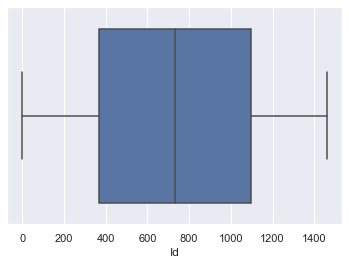

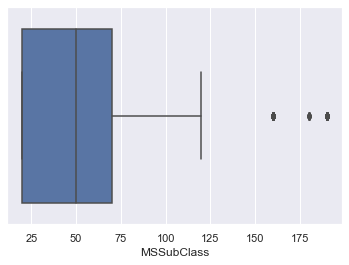

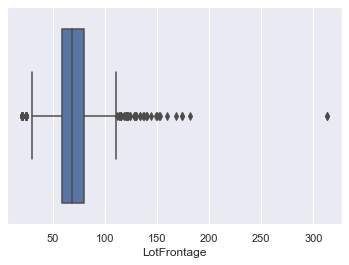

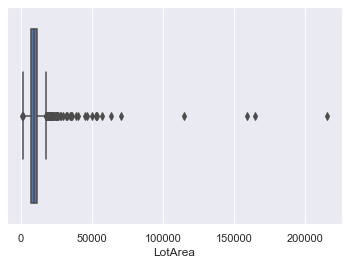

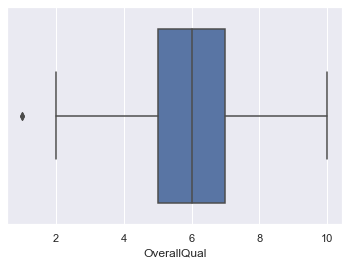

...

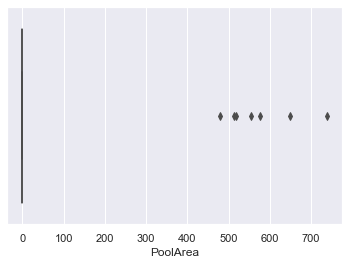

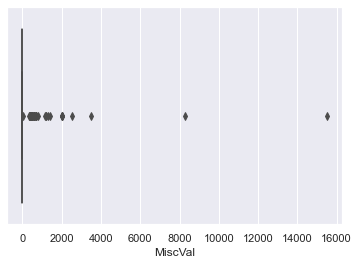

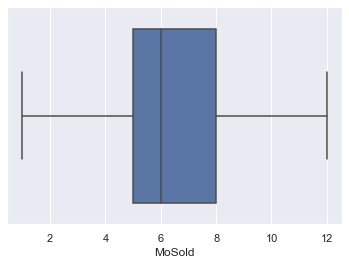

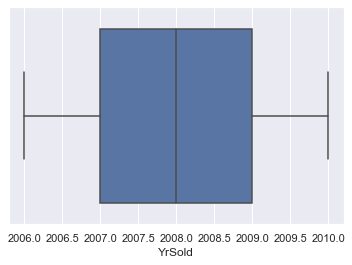

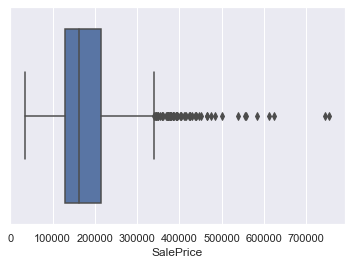

Distribution Analysis - Histogram


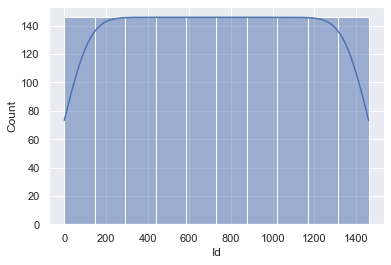

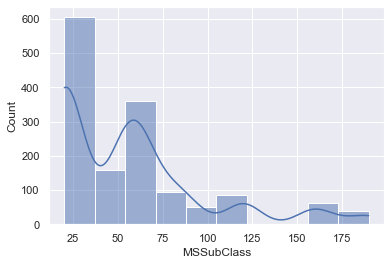

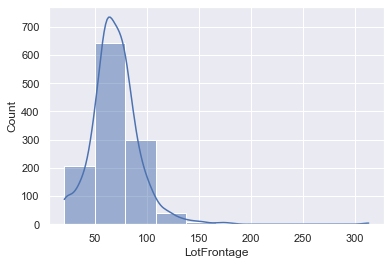

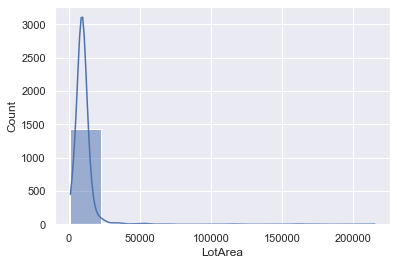

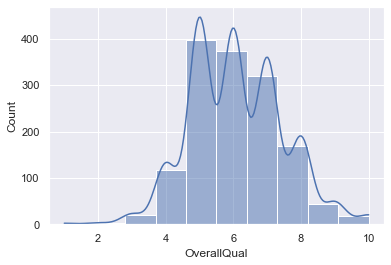

...

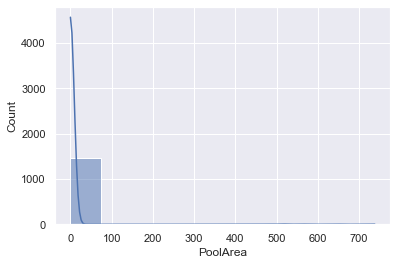

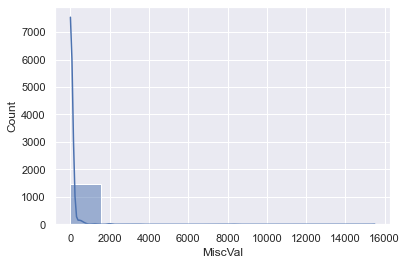

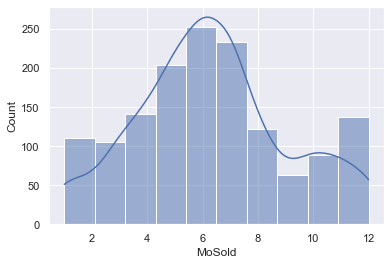

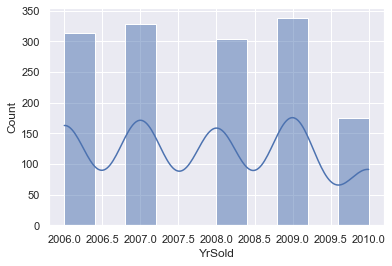

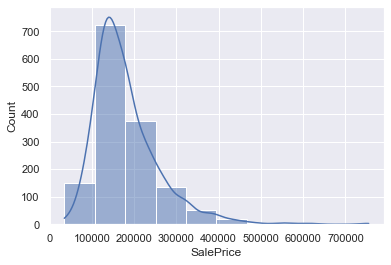

In [5]:
eda_num(datos)

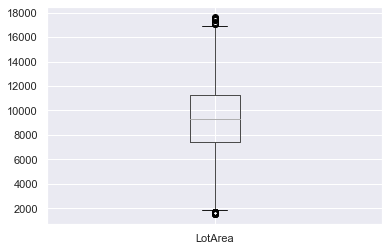

In [6]:
a = datos['LotArea']
b = pd.DataFrame(a)

b = clean(b, method="outliers", 
      columns=[]) 

boxplot = b.boxplot(column=['LotArea'])


In [7]:
DataCuant = pd.DataFrame(datos, columns = ['LotFrontage', 'LotArea','YearBuilt','YearRemodAdd',
                                           'MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF',
                                          'TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF',
                                           'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
                                           'HalfBath','BedroomAbvGr','KitchenAbvGr', 'TotRmsAbvGrd',
                                           'Fireplaces','GarageCars', 'GarageArea', 'WoodDeckSF','OpenPorchSF',
                                           'PoolArea', 'MoSold',
                                           'SalePrice'])
eda_num(DataCuant, method='correlation')

Correlation Analysis - Heatmap


C:\Users\eragr\AppData\Roaming\Python\Python39\site-packages\quickda\explore_numeric.py:30: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,PoolArea,MoSold,SalePrice
LotFrontage,1.00,0.43,0.12,0.09,0.19,0.23,0.05,0.13,0.39,0.46,0.08,0.04,0.40,0.10,-0.01,0.20,0.05,0.26,-0.01,0.35,0.27,0.29,0.34,0.09,0.15,0.21,0.01,0.35
LotArea,0.43,1.00,0.01,0.01,0.10,0.21,0.11,-0.00,0.26,0.30,0.05,0.00,0.26,0.16,0.05,0.13,0.01,0.12,-0.02,0.19,0.27,0.15,0.18,0.17,0.08,0.08,0.00,0.26
YearBuilt,0.12,0.01,1.00,0.59,0.32,0.25,-0.05,0.15,0.39,0.28,0.01,-0.18,0.20,0.19,-0.04,0.47,0.24,-0.07,-0.17,0.10,0.15,0.54,0.48,0.22,0.19,0.00,0.01,0.52
YearRemodAdd,0.09,0.01,0.59,1.00,0.18,0.13,-0.07,0.18,0.29,0.24,0.14,-0.06,0.29,0.12,-0.01,0.44,0.18,-0.04,-0.15,0.19,0.11,0.42,0.37,0.21,0.23,0.01,0.02,0.51
MasVnrArea,0.19,0.10,0.32,0.18,1.00,0.26,-0.07,0.11,0.36,0.34,0.17,-0.07,0.39,0.09,0.03,0.28,0.20,0.10,-0.04,0.28,0.25,0.36,0.37,0.16,0.13,0.01,-0.01,0.48
BsmtFinSF1,0.23,0.21,0.25,0.13,0.26,1.00,-0.05,-0.50,0.52,0.45,-0.14,-0.06,0.21,0.65,0.07,0.06,0.00,-0.11,-0.08,0.04,0.26,0.22,0.30,0.20,0.11,0.14,-0.02,0.39
BsmtFinSF2,0.05,0.11,-0.05,-0.07,-0.07,-0.05,1.00,-0.21,0.10,0.10,-0.10,0.01,-0.01,0.16,0.07,-0.08,-0.03,-0.02,-0.04,-0.04,0.05,-0.04,-0.02,0.07,0.00,0.04,-0.02,-0.01
BsmtUnfSF,0.13,-0.00,0.15,0.18,0.11,-0.50,-0.21,1.00,0.42,0.32,0.00,0.03,0.24,-0.42,-0.10,0.29,-0.04,0.17,0.03,0.25,0.05,0.21,0.18,-0.01,0.13,-0.04,0.03,0.21
TotalBsmtSF,0.39,0.26,0.39,0.29,0.36,0.52,0.10,0.42,1.00,0.82,-0.17,-0.03,0.45,0.31,-0.00,0.32,-0.05,0.05,-0.07,0.29,0.34,0.43,0.49,0.23,0.25,0.13,0.01,0.61
1stFlrSF,0.46,0.30,0.28,0.24,0.34,0.45,0.10,0.32,0.82,1.00,-0.20,-0.01,0.57,0.24,0.00,0.38,-0.12,0.13,0.07,0.41,0.41,0.44,0.49,0.24,0.21,0.13,0.03,0.61


In [8]:
pd.set_option('display.max_column', None)
pd.set_option('display.max_row', None)


In [9]:
datos.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [10]:
datos[['BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive']]

,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive
0,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y
1,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y
2,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y
3,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y
4,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y
5,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y
6,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y
7,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y
8,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y
9,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939.0,RFn,1,205,Gd,TA,Y


In [11]:
datos.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [12]:
datos.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [13]:
datos.loc[datos["PoolQC"] == "Ex","PoolQC"]=5
datos.loc[datos["PoolQC"] == "Gd","PoolQC"]=4
datos.loc[datos["PoolQC"] == "TA","PoolQC"]=3
datos.loc[datos["PoolQC"] == "Fa","PoolQC"]=2
datos.loc[datos["PoolQC"].isna(),"PoolQC"]=1

In [14]:
datos.loc[datos["MiscFeature"].isna(),"MiscFeature"]=0
datos.loc[datos["MiscFeature"] == "Elev" ,"MiscFeature"]=1
datos.loc[datos["MiscFeature"] == "2nd Garage","MiscFeature"]=2
datos.loc[datos["MiscFeature"] == "Othr","MiscFeature"]=3
datos.loc[datos["MiscFeature"] == "Shed" ,"MiscFeature"]=4

In [15]:
datos.loc[datos["FireplaceQu"] == "Ex","FireplaceQu"]=5
datos.loc[datos["FireplaceQu"] == "Gd","FireplaceQu"]=4
datos.loc[datos["FireplaceQu"] == "TA","FireplaceQu"]=3
datos.loc[datos["FireplaceQu"] == "Fa","FireplaceQu"]=2
datos.loc[datos["FireplaceQu"] == "Fa","FireplaceQu"]=1
datos.loc[datos["FireplaceQu"].isna(),"FireplaceQu"]=0


In [16]:
datos.loc[datos["Alley"].isna(),"Alley"]=0
datos.loc[datos["Alley"] == "Pave" ,"Alley"]=1
datos.loc[datos["Alley"] == "Grvl","Alley"]=2

In [17]:
datos.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,1,NaN,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,0,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,3,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,1,NaN,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,3,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,1,NaN,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,4,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,1,NaN,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,0,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,3,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,1,NaN,0,0,12,2008,WD,Normal,250000


## Análisis exploratorio


In [18]:
datos.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [19]:
explore(datos, method="summarize") 

C:\Users\eragr\AppData\Roaming\Python\Python39\site-packages\quickda\explore_data.py:26: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\eragr\AppData\Roaming\Python\Python39\site-packages\quickda\explore_data.py:30: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
1stFlrSF,int64,1460,0,0.000,753,334,882.0,1087.0,1391.25,4692,1162.626712,1087.0,386.587738,1.376757
2ndFlrSF,int64,1460,0,0.000,417,0,0.0,0.0,728.0,2065,346.992466,0.0,436.528436,0.81303
3SsnPorch,int64,1460,0,0.000,20,0,0.0,0.0,0.0,508,3.409589,0.0,29.317331,10.304342
Alley,object,1460,0,0.000,3,0,-,-,-,2,-,-,-,-
BedroomAbvGr,int64,1460,0,0.000,8,0,2.0,3.0,3.0,8,2.866438,3.0,0.815778,0.21179
BldgType,object,1460,0,0.000,5,1Fam,-,-,-,TwnhsE,-,-,-,-
BsmtCond,object,1423,37,0.025,4,-,-,-,-,-,-,-,-,-
BsmtExposure,object,1422,38,0.026,4,-,-,-,-,-,-,-,-,-
BsmtFinSF1,int64,1460,0,0.000,637,0,0.0,383.5,712.25,5644,443.639726,383.5,456.098091,1.685503
BsmtFinSF2,int64,1460,0,0.000,144,0,0.0,0.0,0.0,1474,46.549315,0.0,161.319273,4.255261


Outlier Analysis - Boxplot


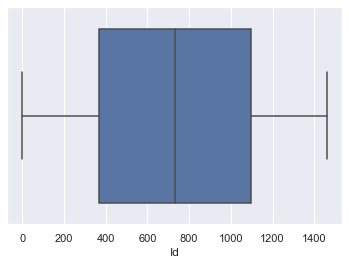

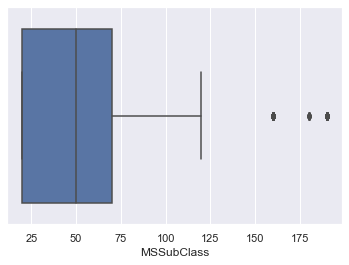

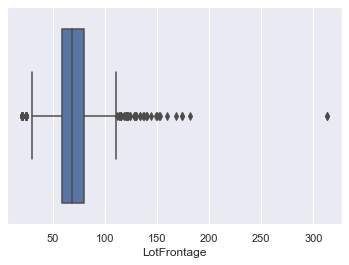

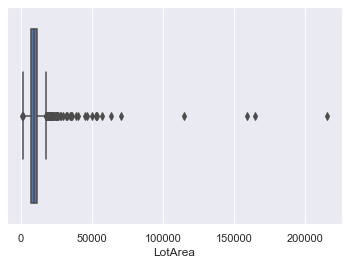

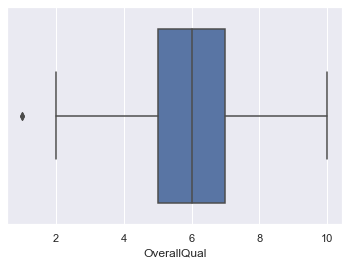

...

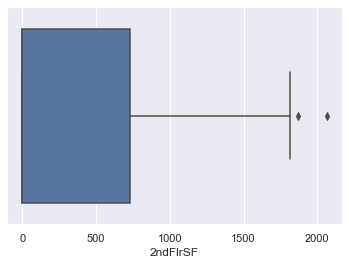

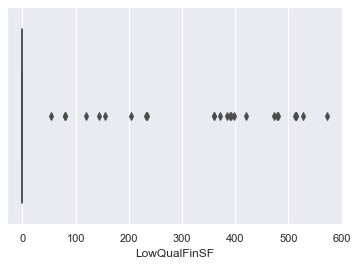

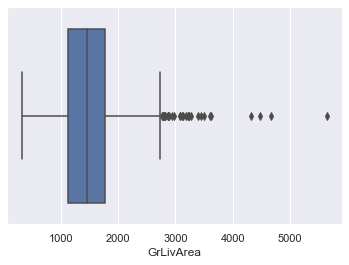

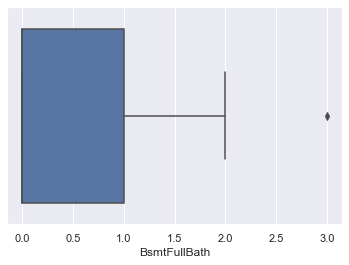

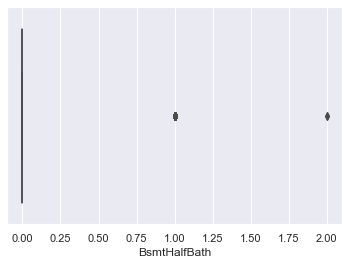

KeyboardInterrupt: 

In [20]:
eda_num(datos)

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(datos)
profile

In [21]:
datos.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
12.5%    110000.000000
25%      129975.000000
37.5%    144000.000000
50%      163000.000000
62.5%    182987.500000
75%      214000.000000
87.5%    263870.625000
max      755000.000000
Name: SalePrice, dtype: float64

# Manipulacion

In [84]:
df_facto = datos.copy()

In [85]:
columnas = df_facto.columns

In [86]:
for i in range(len(columnas)):
    col = columnas[i]
    df_facto[col] = pd.factorize(df_facto[col])[0]

In [142]:
df_facto['Price_Octavos'] = 0

df_facto.loc[datos["SalePrice"] <= 755000 ,"Price_Octavos"]=8
#df_facto.loc[datos["SalePrice"] <= 263870.625,"Price_Octavos"]=7
df_facto.loc[datos["SalePrice"] <= 214000,"Price_Octavos"]=6
#df_facto.loc[datos["SalePrice"] <= 182987.5,"Price_Octavos"]=5
df_facto.loc[datos["SalePrice"] <= 163000 ,"Price_Octavos"]=4
#df_facto.loc[datos["SalePrice"] <= 144000,"Price_Octavos"]=3
df_facto.loc[datos["SalePrice"] <= 129975,"Price_Octavos"]=2
#df_facto.loc[datos["SalePrice"] <= 110000,"Price_Octavos"]=1

colors = df_facto["Price_Octavos"]

df_facto = df_facto.drop ('Price_Octavos', axis=1)
df_facto = df_facto.drop ('SalePrice', axis=1)
df_facto = df_facto.drop ('Id', axis=1)

KeyError: "['SalePrice'] not found in axis"

In [88]:
datos['SalePrice'].describe(percentiles=[.125,.25,.375,.5,.625,.75,.875])

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
12.5%    110000.000000
25%      129975.000000
37.5%    144000.000000
50%      163000.000000
62.5%    182987.500000
75%      214000.000000
87.5%    263870.625000
max      755000.000000
Name: SalePrice, dtype: float64

# PCA

In [89]:

escalador = StandardScaler()
escalador.fit(df_facto)

StandardScaler()

In [90]:
datos_escalados = escalador.transform(df_facto)

In [91]:
pca = PCA(n_components=2)

In [92]:
pca.fit(datos_escalados)

PCA(n_components=2)

In [93]:
x_pca = pca.transform(datos_escalados)
datos_escalados.shape

(1460, 79)

In [94]:
x_pca.shape

(1460, 2)

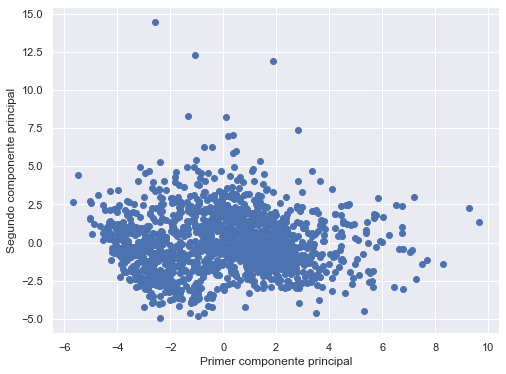

In [95]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1])
plt.xlabel('Primer componente principal')
plt.ylabel('Segundo componente principal');

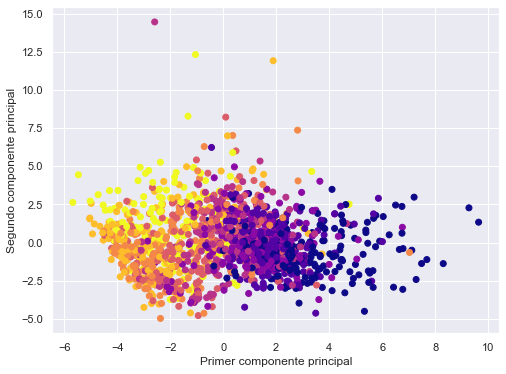

In [96]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=colors,cmap='plasma')
#plt.legend(cancer["target_names"], loc = "upper right")
plt.xlabel('Primer componente principal')
plt.ylabel('Segundo componente principal');

In [97]:
df_comp = pd.DataFrame(pca.components_,columns=df_facto.columns)

<AxesSubplot:>

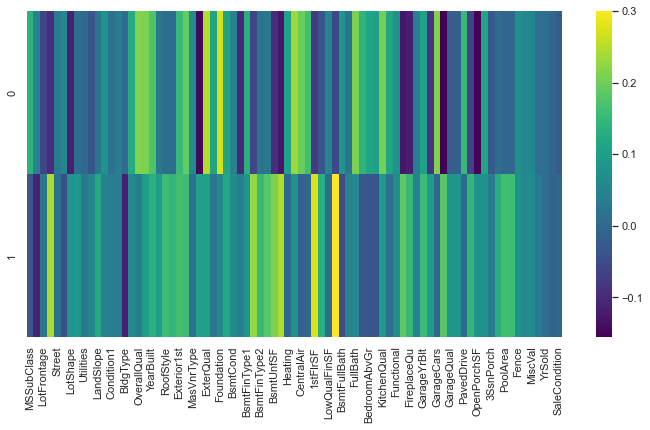

In [98]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp,cmap="viridis",)  # probar con cmap="plasma", para otros colores

In [107]:
pca.components_

array([[ 0.13679137,  0.04743429, -0.06398238, -0.09624615,  0.0335451 ,
         0.05639583, -0.1145469 ,  0.00843613, -0.00145845, -0.03398144,
         0.02450538,  0.07993815,  0.01586945,  0.03694223,  0.00066813,
         0.12259664,  0.21332623,  0.21072862,  0.17254036,  0.02767609,
         0.01023907,  0.00653581,  0.15229175,  0.19153902,  0.06058475,
        -0.14707024,  0.24819762,  0.11026155,  0.27016395,  0.11083212,
         0.04426761, -0.10436163,  0.13441293, -0.06157666,  0.02018857,
         0.02510217, -0.09567564, -0.13202256,  0.10795892,  0.23307609,
         0.19610339,  0.16273618, -0.07703171, -0.03701374,  0.05168899,
        -0.05528489,  0.08195566,  0.02306675,  0.21054391,  0.14134133,
         0.11406412,  0.10238745,  0.20399017,  0.11206538,  0.07518983,
        -0.12925257, -0.11650734,  0.04190688,  0.10675766, -0.08686061,
         0.21394286, -0.15522681, -0.02195013, -0.01736066,  0.15212568,
        -0.06544988, -0.1505233 ,  0.11272703, -0.0

In [108]:
a = pca.components_[0]
to_pop = []
n = 0
for i in range(len(a)):
    if(abs(a[i]) < 0.05):
        to_pop.append(i)
        n += 1
n

28

In [109]:
column = df_facto.columns.values.tolist ()
for i in range(len(to_pop)):
    n = len(to_pop)-i
    column.pop(n)

In [110]:
df_PCA_2 = df_facto[column].copy()

In [111]:

escalador = StandardScaler()
escalador.fit(df_PCA_2)

StandardScaler()

In [112]:
datos_escalados = escalador.transform(df_PCA_2)

In [113]:
pca = PCA(n_components=2)

In [114]:
pca.fit(datos_escalados)

PCA(n_components=2)

In [115]:
x_pca = pca.transform(datos_escalados)
datos_escalados.shape

(1460, 51)

In [116]:
x_pca.shape

(1460, 2)

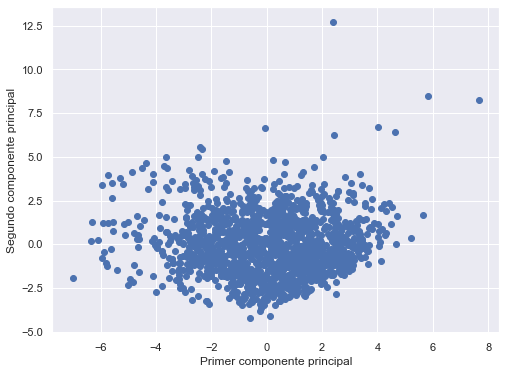

In [117]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1])
plt.xlabel('Primer componente principal')
plt.ylabel('Segundo componente principal');

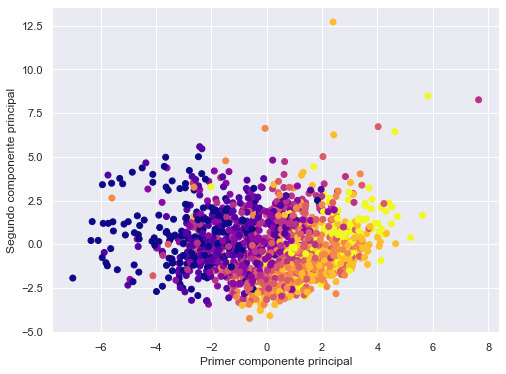

In [118]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=colors,cmap='plasma')
#plt.legend(cancer["target_names"], loc = "upper right")
plt.xlabel('Primer componente principal')
plt.ylabel('Segundo componente principal');

In [119]:
df_comp = pd.DataFrame(pca.components_,columns=df_PCA_2.columns)

<AxesSubplot:>

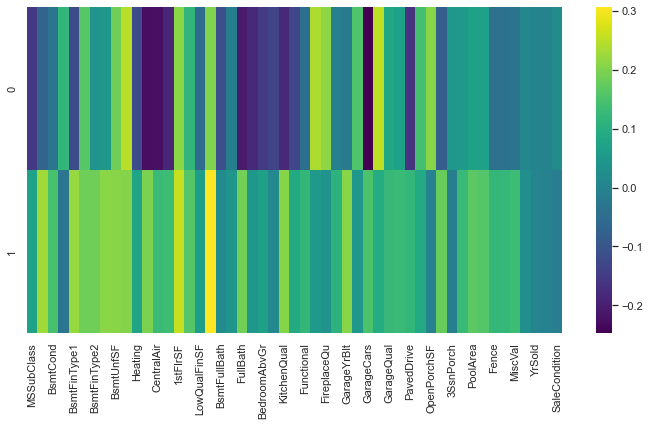

In [120]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp,cmap="viridis",)  # probar con cmap="plasma", para otros colores

In [121]:
len(pca.components_[0])

51

In [122]:
a = pca.components_[0]
to_pop = []
n = 0
for i in range(len(a)):
    if(abs(a[i]) < 0.05):
        to_pop.append(i)
        n += 1
n

15

In [123]:
clmn = datos.columns.values.tolist()
clmn = [ 'MSZoning',
 'LotFrontage',
 'LotArea',
 'LandContour',
 'Neighborhood',
 'OverallQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'HeatingQC',
 'CentralAir',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr','Fireplaces',
 'GarageType',
 'GarageFinish',
 'GarageCars','GarageQual',
 'OpenPorchSF',
 'EnclosedPorch',
 'PoolArea',
 'MiscVal',
 'MoSold']

In [124]:

escalador = StandardScaler()
escalador.fit(df_facto[clmn])

StandardScaler()

In [125]:
datos_escalados = escalador.transform(df_facto[clmn])

In [126]:
pca = PCA(n_components=2)

In [127]:
pca.fit(datos_escalados)

PCA(n_components=2)

In [128]:
x_pca = pca.transform(datos_escalados)
datos_escalados.shape

(1460, 25)

In [129]:
x_pca.shape

(1460, 2)

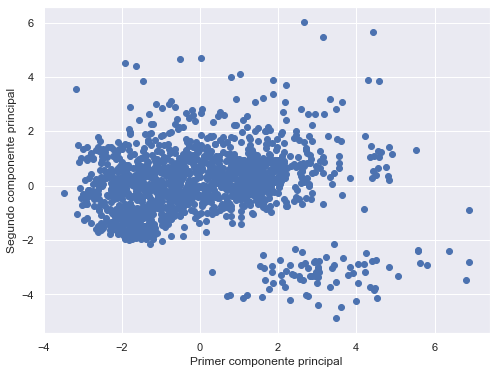

In [130]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1])
plt.xlabel('Primer componente principal')
plt.ylabel('Segundo componente principal');

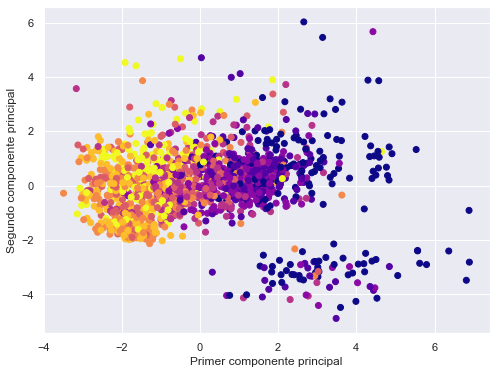

In [131]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=colors,cmap='plasma')
#plt.legend(cancer["target_names"], loc = "upper right")
plt.xlabel('Primer componente principal')
plt.ylabel('Segundo componente principal');

In [132]:
df_comp = pd.DataFrame(pca.components_,columns=df_facto[clmn].columns)

<AxesSubplot:>

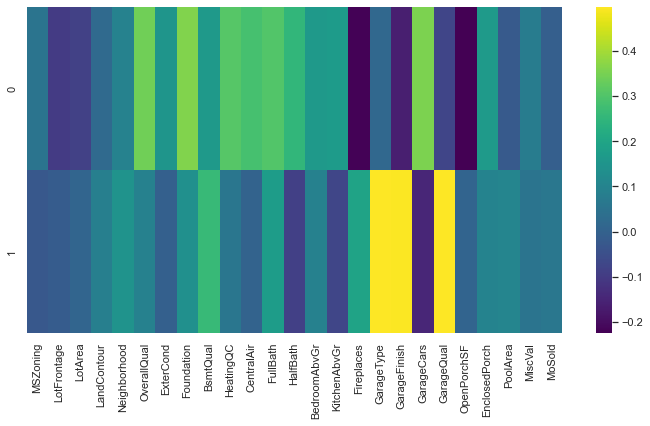

In [133]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp,cmap="viridis",)  # probar con cmap="plasma", para otros colores

In [134]:
pca.components_

array([[ 0.0519413 , -0.09747656, -0.08371225,  0.02098424,  0.09551002,
         0.34121558,  0.15185673,  0.3606328 ,  0.16201189,  0.30644647,
         0.2841106 ,  0.30184987,  0.25120967,  0.16443198,  0.16952844,
        -0.21981324,  0.01605328, -0.16270476,  0.35368793, -0.07744037,
        -0.22413282,  0.16699014, -0.02290129,  0.0771403 , -0.00867129],
       [-0.02949411, -0.01698493,  0.00826957,  0.08310617,  0.14630575,
         0.09049525, -0.00454068,  0.13632563,  0.26269547,  0.05981839,
         0.00153912,  0.17073423, -0.08616391,  0.09064081, -0.07463381,
         0.19318551,  0.49697836,  0.49191026, -0.14549332,  0.49588796,
         0.00544501,  0.09913244,  0.10525831,  0.05207029,  0.06092727]])

# A priori

In [135]:
categoricas = df_facto[clmn]
categoricas = categoricas.astype(object)
categoricas

,MSZoning,LotFrontage,LotArea,LandContour,Neighborhood,OverallQual,ExterCond,Foundation,BsmtQual,HeatingQC,CentralAir,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageType,GarageFinish,GarageCars,GarageQual,OpenPorchSF,EnclosedPorch,PoolArea,MiscVal,MoSold
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,1,0,1,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1
2,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2,0,0,0,2
3,0,3,3,0,2,0,0,2,1,1,0,1,1,0,0,1,1,1,1,0,3,1,0,0,0
4,0,4,4,0,3,2,0,0,0,0,0,0,0,1,0,1,0,0,1,0,4,0,0,0,3
5,0,5,5,0,4,3,0,3,0,0,0,1,0,2,0,0,0,1,0,0,5,0,0,1,4
6,0,6,6,0,5,2,0,0,2,0,0,0,1,0,0,1,0,0,0,0,6,0,0,0,5
7,0,-1,7,0,6,0,0,1,0,0,0,0,0,0,0,2,0,0,0,0,7,2,0,2,6
8,1,7,8,0,7,0,0,2,1,1,0,0,1,3,1,2,1,1,0,1,1,3,0,0,7
9,0,8,9,0,8,3,0,2,1,0,0,1,1,3,1,2,0,0,2,2,8,0,0,0,8


## Transformando los datos

In [136]:
print(categoricas.shape)
# Se van a convertir los datos a una lista de listas
records = []
for i in range(0, 1460):
    records.append([str(categoricas.values[i,j]) for j in range(0, 25)])

(1460, 25)


In [137]:
records

[['0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0'],
 ['0',
  '1',
  '1',
  '0',
  '1',
  '1',
  '0',
  '1',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '1'],
 ['0',
  '2',
  '2',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '0',
  '0',
  '0',
  '2',
  '0',
  '0',
  '0',
  '2'],
 ['0',
  '3',
  '3',
  '0',
  '2',
  '0',
  '0',
  '2',
  '1',
  '1',
  '0',
  '1',
  '1',
  '0',
  '0',
  '1',
  '1',
  '1',
  '1',
  '0',
  '3',
  '1',
  '0',
  '0',
  '0'],
 ['0',
  '4',
  '4',
  '0',
  '3',
  '2',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '1',
  '0',
  '1',
  '0',
  '0',
  '1',
  '0',
  '4',
  '0',
  '0',
  '0',
  '3'],
 ['0',
  '5',
  '5',
  '0',
  '4',
  '3',
  '0',
  '3',
  '0',
  '0',
  '0',
  '1',
  '0',
  '2',
  '0',
  '0',
  '0',
 

In [151]:
# El mínimo de cobertura o soporte es 20% y el mínimo de confianza es 70%
reglas_asociacion = apriori(records,min_support=0.20, min_confidence = 0.8)
reglas = list(reglas_asociacion)

In [152]:
print(len(reglas))

33


Se crearon 16 reglas con los umbrales proporcionados

In [153]:
print(reglas[0])

RelationRecord(items=frozenset({'0'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'0'}), confidence=1.0, lift=1.0)])


In [154]:
for regla in reglas:
    p = regla[0]
    for e in p:
        print(e)
    #print("La regla: "+elementos)

0
1
2
-1
0
-1
1
0
1
0
11
2
0
3
0
0
5
9
0
1
11
2
1
3
1
1
5
9
1
2
3
-1
0
1
11
0
1
2
0
1
3
0
1
0
5
1
9
0
1
2
0
11
3
0
11
3
2
0
2
0
5
2
1
11
3
1
11
3
2
1
2
11
0
1
3
11
0
1
3
2
0
1
